In [1]:
#Import standard libraries and set up notebook output for Matplotlib and Plotly

%matplotlib inline
from glob import glob
import numpy as np
from scipy.misc import imread
from scipy.spatial.distance import euclidean
from plotly.offline import (download_plotlyjs,
                            init_notebook_mode,
                            iplot,
                           )
from plotly.graph_objs import *
init_notebook_mode()
from datetime import datetime
from random import sample
import plotly.tools

In [2]:
#Change directories to where titiwai code and demo image is located
%cd /stor/home/aboulgak/titiwai_demo
import titiwai

/stor/home/aboulgak/titiwai_demo


In [3]:
#Notebook below can iterate over many images of 96 well plates. They are stored here.
plates = []

In [4]:
#Load all images
image_suffix = ".jpg"
image_files = glob("*" + image_suffix)

for f in sorted(image_files):
    try:
        plate = titiwai.Plate(image=imread(f),
                              tag_in='original_image',
                              source_filename=f,
                             )
        plates.append(plate)
    except Exception as e:
        print(e)
        print(p)
        failed_plates.add(p)
print("Files loaded at " + str(datetime.now()))

Files loaded at 2018-05-26 16:22:39.742645


/stor/home/aboulgak/anaconda3/lib/python2.7/site-packages/ipykernel_launcher.py:7: DeprecationWarning:

`imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.



In [5]:
#Print plate filenames
for plate in plates:
    print(plate.metadata['source_filename'])

unknown DFP-3.jpg


In [6]:
#Color invert images
for plate in plates:
    plate.invert_image(tag_in='original_image',
                       tag_out='inverted_image',
                      )

In [7]:
#Crop images
for p, plate in enumerate(plates):
    try:
        plate.crop_border(tag_in='inverted_image',
                          tag_out='border_cropped_image',
                          border=5,
                         )
    except Exception as e:
        print(e)
        print(p)
        failed_plates.add(p)
print("Borders cropped at " + str(datetime.now()))

Borders cropped at 2018-05-26 16:22:39.780907


In [8]:
#Invert back to original colors after cropping for display purposes below
for plate in plates:
    plate.invert_image(tag_in='border_cropped_image',
                       tag_out='inverted_border_cropped_image',
                      )

In [9]:
#Waterfall segmentat fluorescent wells
for p, plate in enumerate(plates):
    print("Plate #" + str(p + 1) + " of " + str(len(plates)) + ": "
          + str(plate.metadata['source_filename']) + " at " + str(datetime.now()))
    plate.waterfall_segmentation(tag_in='border_cropped_image',
                                 feature_out='waterfall_basins',
                                 R_out='R_img',
                                 mg_out='mg_img',
                                 median_disk_radius=None,
                                 smoothing_sigma=1,
                                 threshold_opening_size=10,
                                 basin_open_close_size=0,
                                 debug_output=False,
                                )

Plate #1 of 1: unknown DFP-3.jpg at 2018-05-26 16:22:39.809569


Plate #1 of 1: unknown DFP-3.jpg


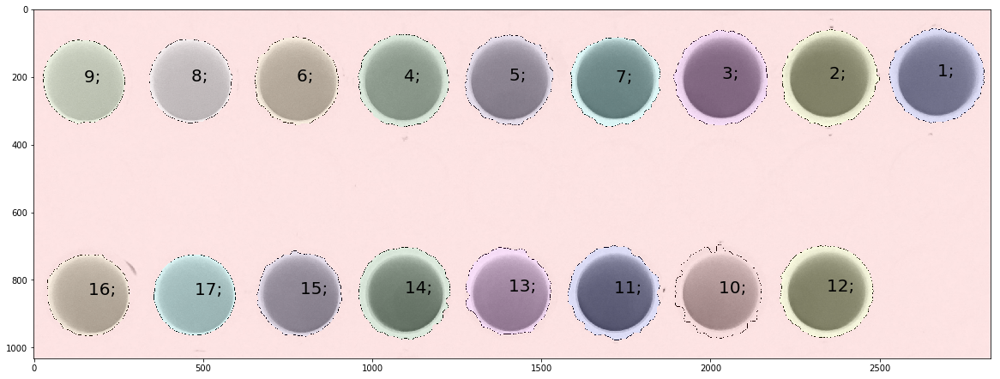

Eroded


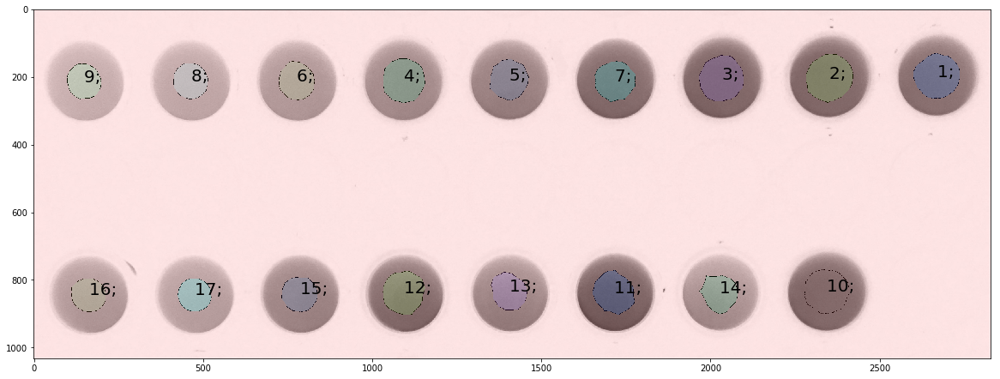

Grid assignments {row: (well numbers)}
{0: (9, 8, 6, 4, 5, 7, 3, 2, 1), 1: (16, 17, 15, 12, 13, 11, 14, 10)}


In [10]:
#Filter for proper fluorescent wells and then erode them to innermost representative pixels

#Display size of plate image
figsize = 20

#Binary erosion size in pixels
erosion_size = 70

for p, plate in enumerate(plates):
    print("Plate #" + str(p + 1) + " of " + str(len(plates)) + ": "
          + str(plate.metadata['source_filename']))
    plate.remove_background_basins(tag_in='border_cropped_image',
                                   basins_feature='waterfall_basins',
                                   feature_out='strongest_basins',
                                   z=2,
                                   open_close_size=10,
                                   debug_output=False,
                                  )
    plate.find_basin_centroids(tag_in='border_cropped_image',
                               basins_feature='strongest_basins',
                               feature_out='basin_centroids',
                              )
    plate.display(tag_in='border_cropped_image',
                  basins_feature='strongest_basins',
                  basin_centroids_feature='basin_centroids',
                  figsize=figsize,
                  display_labels=True,
                 )
    strongest_basins = plate.feature_stash['strongest_basins']
    print("Eroded")
    eroded_basins = titiwai.Plate.erode_basins(basins=strongest_basins,
                                               erosion_size=erosion_size,
                                               rectangular=False,
                                               exclude_label=0,
                                              )
    plate.feature_stash['eroded_basins'] = eroded_basins
    plate.find_basin_centroids(tag_in='border_cropped_image',
                               basins_feature='eroded_basins',
                               feature_out='eroded_basin_centroids',
                              )
    plate.display(tag_in='border_cropped_image',
                  basins_feature='eroded_basins',
                  basin_centroids_feature='eroded_basin_centroids',
                  figsize=figsize,
                  display_labels=True,
                 )
    nothing, grid_assignments = plate.assign_grid(centroids_feature='eroded_basin_centroids',
                                                  feature_out='grid_assignments',
                                                 )
    print("Grid assignments {row: (well numbers)}")
    print(grid_assignments)

In [11]:
#Convert representative pixels into xyY colorspace
for p, plate in enumerate(plates):
    empty, (colorspace, eroded_basin_colors) = plate.basin_colors(
                       tag_in='inverted_border_cropped_image',
                       basins_feature='eroded_basins',
                       feature_out='eroded_basin_colors_xyY',
                       color_space='xyY',
                                                                 )
    plate.feature_stash['merged_basin_colors_xyY'] = (colorspace, eroded_basin_colors)

Plate #0: unknown DFP-3.jpg


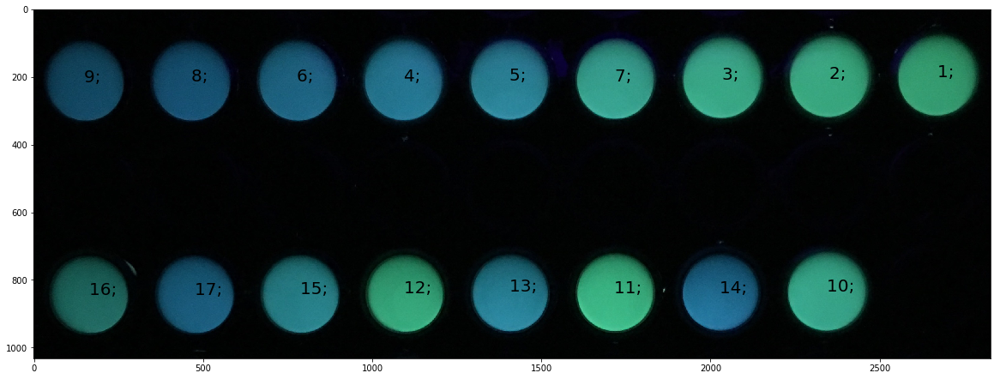

Grid assignments {row: (well numbers)}
{0: (9, 8, 6, 4, 5, 7, 3, 2, 1), 1: (16, 17, 15, 12, 13, 11, 14, 10)}
Colorspace: xyY


In [12]:
#Display plates and plot pixel chromaticities

#Num of pixel chromaticities to plot per well
subsample = 20

#display a broad swath of the colorspace
x_range = (0, 0.8)
y_range = (0, 0.9)

for p, plate in enumerate(plates):
    print("Plate #" + str(p) + ": " + plate.metadata['source_filename'])
    plate.display(tag_in='inverted_border_cropped_image',
                  basin_centroids_feature='eroded_basin_centroids',
                  figsize=figsize,
                  display_labels=True,
                 )
    print("Grid assignments {row: (well numbers)}")
    print(plate.feature_stash['grid_assignments'])
    
    colorspace, merged_basin_colors = plate.feature_stash['merged_basin_colors_xyY']
    print("Colorspace: " + str(colorspace))
    
       
    subsampled_basin_colors = {basin:
                               sample(pixels, min(subsample, len(pixels)))
                               for basin, pixels in merged_basin_colors.iteritems()
                               if basin != 0 #Omit plate background
                              }
    basin_xys = {basin: tuple([pixel[:2] for pixel in pixels])
                 for basin, pixels in subsampled_basin_colors.iteritems()}
    zipped_xys = {basin: zip(*xys) for basin, xys in basin_xys.iteritems()}
    traces = [graph_objs.Scatter(x=x, y=y, mode='markers', name=str(basin))
              for basin, (x, y) in zipped_xys.iteritems()]
    layout = graph_objs.Layout(plot_bgcolor='rgba(0,0,0,0)',
                               paper_bgcolor='rgba(0,0,0,0)',
                               xaxis=dict(title="x",
                                          range=x_range,
                                          tickfont=dict(size=18,
                                                       )
                                         ),
                               yaxis=dict(title="y",
                                          range=y_range,
                                          tickfont=dict(size=18,
                                                       )
                                         ),
                               title="A subsample of pixel chromaticities in xyY colorspace",
                              )
    fig = graph_objs.Figure(data=traces, layout=layout)
    iplot(fig)

In [13]:
#Compute luminosity & chromaticity medians

for p, plate in enumerate(plates):
    print("Plate #" + str(p) + ": " + plate.metadata['source_filename'] + " at " + str(datetime.now()))
    colorspace, merged_basin_colors = plate.feature_stash['merged_basin_colors_xyY']
    basin_Ys = {basin: [pixel[2] for pixel in pixels]
                for basin, pixels in merged_basin_colors.iteritems()
                #if basin != 0
               }
    basin_Y_medians = {basin: round(np.median(Ys) * 100, 1) for basin, Ys in basin_Ys.iteritems()}
    plate.feature_stash['basin_Y_medians'] = basin_Y_medians
    basin_xys = {basin: tuple([pixel[:2] for pixel in pixels])
                 for basin, pixels in merged_basin_colors.iteritems()
                }
    zipped_xys = {basin: zip(*xys) for basin, xys in basin_xys.iteritems()}
    basin_xy_medians = {basin: (np.median(xs), np.median(ys))
                        for basin, (xs, ys) in zipped_xys.iteritems()}
    plate.feature_stash['basin_xy_medians'] = basin_xy_medians

Plate #0: unknown DFP-3.jpg at 2018-05-26 16:25:16.980554


In [14]:
#Assign a row to be the calibration row

#{plate: row}
calibration_rows = {0:0}

print(calibration_rows)

for p, plate in enumerate(plates):
    plate.feature_stash['calibration_row'] = calibration_rows[p]

{0: 0}


In [15]:
#Define well pairs to be used as calibration segments

for p, plate in enumerate(plates):
    grid_assignment = plate.feature_stash['grid_assignments']
    calibration_row = plate.feature_stash['calibration_row']
    if calibration_row is None:
        continue
    calibration_wells = grid_assignment[calibration_row]
    basin_xy_medians = plate.feature_stash['basin_xy_medians']
    calibration_segments = [(w1, w2, basin_xy_medians[w1], basin_xy_medians[w2])
                            for w1, w2 in plate.pairwise(calibration_wells)]
    plate.feature_stash['calibration_segments'] = tuple(calibration_segments)

Plate #0: unknown DFP-3.jpg


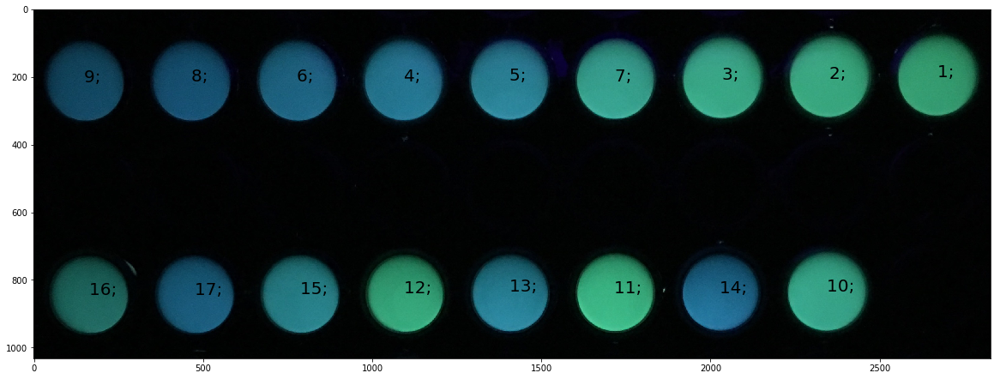

well = 16
Best representative calibration well segment = (5, 7)
Chromaticity between wells 5 and 7
Chromaticity distance to well 5 = 0.068; to well 7 = 0.011
Color composition: 13.6619555326% well 5 and 86.3380444674% well 7


well = 17
Best representative calibration well segment = (9, 8)
Chromaticity between wells 9 and 8
Chromaticity distance to well 9 = 0.001; to well 8 = 0.008
Color composition: 87.379584997% well 9 and 12.620415003% well 8


well = 15
Best representative calibration well segment = (5, 7)
Chromaticity between wells 5 and 7
Chromaticity distance to well 5 = 0.024; to well 7 = 0.055
Color composition: 69.6448323016% well 5 and 30.3551676984% well 7


well = 12
Best representative calibration well segment = (2, 1)
Chromaticity between wells 2 and 1
Chromaticity distance to well 2 = 0.01; to well 1 = 0.008
Color composition: 44.0641150839% well 2 and 55.9358849161% well 1


well = 13
Best representative calibration well segment = (4, 5)
Chromaticity between wells 4 an

In [16]:
#Output unknown well's compositions in terms of calibration wells

for p, plate in enumerate(plates):
    if 'calibration_segments' not in plate.feature_stash:
        print("Plate " + str(p) + " lacks calibration_segments.")
        continue
    print("Plate #" + str(p) + ": " + plate.metadata['source_filename'])
    grid_assignment = plate.feature_stash['grid_assignments']
    calibration_row = plate.feature_stash['calibration_row']
    calibration_segments = plate.feature_stash['calibration_segments']
    basin_xy_medians = plate.feature_stash['basin_xy_medians']
    
    well_betweens = {}
    
    plate.display(tag_in='inverted_border_cropped_image',
                  basin_centroids_feature='eroded_basin_centroids',
                  figsize=figsize,
                  display_labels=True,
                 )
    
    for row, wells in grid_assignment.iteritems():
        if row == calibration_row:
            continue
        for well in wells:
            print("well = " + str(well))
            best_projection, best_segment, left_distance, right_distance = \
                               plate.fit_segments_v2(chromaticity=basin_xy_medians[well],
                                                      calibration_segments=calibration_segments,
                                                     )
            print("Best representative calibration well segment = " + str(best_segment))
            left_percentage = left_distance / float(left_distance + right_distance)
            right_percentage = right_distance / float(left_distance + right_distance)
            between_w1, between_w2 = best_segment
            well_betweens[well] = (between_w1, between_w2)
            print("Chromaticity between wells " + str(between_w1) + " and " + str(between_w2))
            m1, m2 = basin_xy_medians[between_w1], basin_xy_medians[between_w2]
            wm = basin_xy_medians[well]
            d1, d2 = euclidean(wm, m1), euclidean(wm, m2)
            print("Chromaticity distance to well " + str(between_w1) + " = " + str(round(d1, 3))
                  + "; to well " + str(between_w2) + " = " + str(round(d2, 3))
                 )
            if d1 + d2 == 0:
                p1, p2 = 100, 100
            elif between_w1 == between_w2:
                p1, p2 = 100, 100
            else:
                p1, p2 = 100 * d1 / (d1 + d2), 100 * d2 / (d1 + d2)
            print("Color composition: " + str(p2) + "% well " + str(between_w1)
                  + " and " + str(p1) + "% well " + str(between_w2)
                 )
            print("\n")
    print("\n\n\n")
    
    plate.feature_stash['well_betweens'] = well_betweens